## Training a classification model 

#### Loading in the data:

In [1]:
import pandas as pd
training_data = pd.read_parquet('training.parquet')
training_data.sample(10)

,Category,Text
10187,rec.motorcycles,"In article <13714@news.duke.edu>, infante@acpu..."
17769,soc.religion.christian,"Sorry for taking this off of Sharon's resp, bu..."
19499,talk.religion.misc,In article <1993Apr22.031648.2886@a.cs.okstate...
14554,sci.electronics,> Joseph Mich Krzeszewsk writes:\n>\n> Msg-ID:...
16466,sci.space,"\n\n\n\nPress Release No.19-93\nParis, 22 Apri..."
15841,talk.politics.guns,Posted by Cathy Smith for L. Neil Smith\n\n ...
7877,sci.crypt,-----BEGIN PGP SIGNED MESSAGE-----\n\nIn messa...
18127,misc.forsale,A bunch of things i have too many of :\nchips ...
8354,sci.med,In article <myers.735287742@peach.cs.scarolina...
5920,comp.os.ms-windows.misc,In article <1rl9b6$h3c@sol.deakin.OZ.AU> russ@...


### Feature Engineering

We want to transform each of the messages into a numeric vector. One way to do this would be to associate a space in a bit vector with every possible word. We could set each bit to `True` or `1` if the corresponding word appears in that message, and `0` or `False` otherwise. In practice this is not practical because of the huge memory requirements. Instead we use a 'hashing vectoriser' which _hashes_ the words to vectors of a fixed, finite number of bits. 

You can see that many of the messages contain non-standard words or character strings such as email addresses. It is common practice to ignore such words during the feature engineering stage. We do this by setting a 'token_pattern' parameter to ensure that only standard words are hashed. 

We also want to remove any 'stop words' from the text. We do this by setting `stop_words='english'`.


In [2]:
from sklearn.feature_extraction.text import HashingVectorizer
BUCKETS=2048

hv = HashingVectorizer(norm=None, token_pattern='(?u)\\b[A-Za-z]\\w+\\b', stop_words ='english', n_features=BUCKETS, alternate_sign = False)
hv

HashingVectorizer(alternate_sign=False, n_features=2048, norm=None,
                  stop_words='english', token_pattern='(?u)\\b[A-Za-z]\\w+\\b')

In [3]:
hvcounts = hv.fit_transform(training_data["Text"])
hvcounts

<13947x2048 sparse matrix of type '<class 'numpy.float64'>'
	with 1236563 stored elements in Compressed Sparse Row format>

Let's use term frequency-inverse document frequency, or tf-idf, to generate feature vectors. Tf-idf is commonly used to summarise text data, and it aims to capture how important different words are within a set of documents. Tf-idf combines a normalized word count (or term frequency) with the inverse document frequency (or a measure of how common a word is across all documents) in order to identify words, or terms, which are 'interesting' within the document, with respect to the set of documents. 

In [4]:
from sklearn.feature_extraction.text import TfidfTransformer

tfidf_transformer = TfidfTransformer()
hvdf_tfidf = tfidf_transformer.fit_transform(hvcounts)
hvdf_tfidf

<13947x2048 sparse matrix of type '<class 'numpy.float64'>'
	with 1236563 stored elements in Compressed Sparse Row format>

### Visualise the data

We use PCA to see if we can identify structure in the feature vectors. PCA allows us to project the data onto 2 dimensions, which we can then plot. 

In [5]:
import sklearn.decomposition

DIMENSIONS = 2

pca2 = sklearn.decomposition.TruncatedSVD(DIMENSIONS)
pca_a = pca2.fit_transform(hvdf_tfidf)

In [6]:
pca_df = pd.DataFrame(pca_a, columns=["x", "y"])
pca_df.sample(10)

,x,y
4702,0.313633,0.000960
5736,0.101159,0.082899
4946,0.306859,0.092638
13361,0.244201,-0.068196
10308,0.237034,0.040165
8012,0.239374,-0.072103
169,0.244392,-0.056581
8316,0.289911,-0.121274
753,0.149606,0.084270
1015,0.162717,0.072822


In [7]:
plot_data = pd.concat([training_data.reset_index(), pca_df], axis=1)

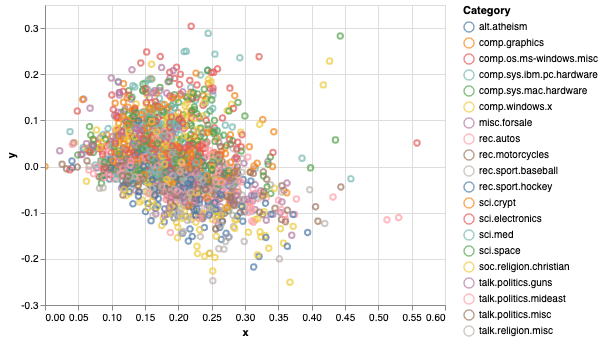

In [8]:
import altair as alt

alt.renderers.enable('notebook')
alt.Chart(plot_data.sample(2000)).encode(x="x", y="y", color="Category").mark_point().interactive()

We've used PCA to transform the data to two dimensions, then plotted it and coloured according to the Category. There is no obvious structure in this data, though we are trying to plot a lot of information in one plot. Let's insead plot the a 1-vs-all plot for each category, and see if this shows more structure.

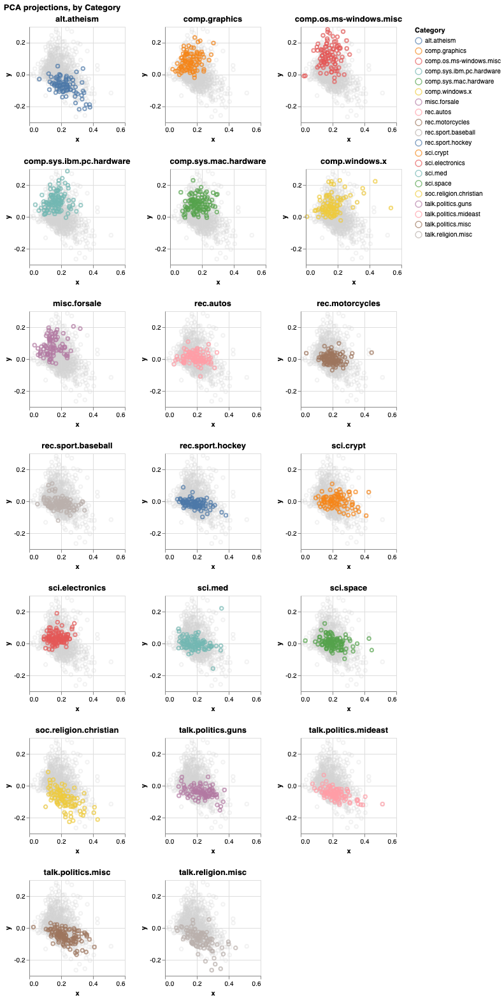

In [9]:
import altair as alt
from altair.expr import datum

data=plot_data.sample(2000)

base = alt.Chart(data).mark_point().encode(
    alt.X('x', scale=alt.Scale(domain=(0, 0.6))),
    alt.Y('y', scale = alt.Scale(domain = (-0.3, 0.3))),
    color='Category:N'
)

## Make gray points for background
chart1 = alt.Chart(data.sample(1000)) \
            .encode(x="x", y="y") \
            .mark_point(opacity=0.3, color="lightgray")


def overlay_make_chart(base_chart, category, options, chart1):
    title = category
    chart2 = base_chart\
      .transform_filter(datum.Category == category)\
      .properties(width=options['width'], 
                    height=options['height'], title=title)
    chart = chart1 + chart2
    return chart


options = {'width': 150, 'height': 150}
charts = [overlay_make_chart(base, category, options, chart1) \
          for category in sorted(data.Category.unique())]

# make a single row
def make_chart_row(row_of_charts):
    hconcat = [chart for chart in row_of_charts]
    row = alt.HConcatChart(hconcat=hconcat)
    return row

# take an array of charts and produce a facet grid
def facet_wrap(charts, charts_per_row):
    rows_of_charts = [
        charts[i:i+charts_per_row] 
        for i in range(0, len(charts), charts_per_row)]        
    vconcat = [make_chart_row(r) for r in rows_of_charts]    
    vcc = alt.VConcatChart(vconcat=vconcat)\
      .configure_axisX(grid=True)\
      .configure_axisY(grid=True)
    return vcc

# assemble the facet grid
compound_chart = facet_wrap(charts, charts_per_row=3)
compound_chart.properties(title='PCA projections, by Category')

This plot shows that there is clear structure in the data - we have captured something meaningful about the categories in the feature engineering stage, and so can see that different categories fall in different regions of 2d space, under PCA projection. 

Let's save the feature engineering stage as a scikit-learn pipeline so we can easily apply this same transformation to new data. 

In [10]:
from sklearn.pipeline import Pipeline 

BUCKETS=2048
hv = HashingVectorizer(norm=None, token_pattern='(?u)\\b[A-Za-z]\\w+\\b', stop_words ='english', n_features=BUCKETS, alternate_sign = False)
tfidf = TfidfTransformer()
feat_pipeline = Pipeline([('vect',hv), ('tfidf',tfidf)])

#### Transforming the training data 

In [11]:
training_vecs = feat_pipeline.fit_transform(training_data["Text"])

### Training a Model

We are going to train an XGBoost Classifier model. 

In [12]:
from xgboost import XGBClassifier

In [13]:
%%time

XGB_TREE_METHOD='hist'
xgb = XGBClassifier(tree_method=XGB_TREE_METHOD, 
                    # num_parallel_tree=16, 
                    n_estimators=100, 
                    max_depth=3, 
                    colsample_bynode=0.3, 
                    colsample_bytree=0.3, 
                    subsample=0.1, 
                    reg_alpha=1)

xgb.fit(training_vecs, training_data["Category"])

CPU times: user 2min 27s, sys: 2.72 s, total: 2min 29s
Wall time: 20.8 s


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=0.3, colsample_bytree=0.3, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=1,
              reg_lambda=1, scale_pos_weight=None, subsample=0.1,
              tree_method='hist', validate_parameters=1, verbosity=None)

### Assess model performance

In [14]:
xgb.score(training_vecs, training_data["Category"])

0.7730694773069477

In [15]:
testing_data = pd.read_parquet('testing.parquet')
testing_vecs=feat_pipeline.transform(testing_data["Text"])
xgb.score(testing_vecs, testing_data["Category"])

0.6591935753722603

In [16]:
from mlworkflows import plot

df, chart =plot.confusion_matrix(testing_data["Category"], xgb.predict(testing_vecs))

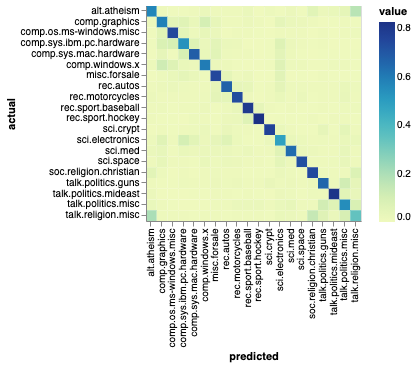

In [17]:
chart

In general this confusion matrix looks okay. Most misclassifications are being made between _similar_ categories, for example Atheism and religion. 

In [18]:
from sklearn.metrics import classification_report
print(classification_report(testing_data["Category"], xgb.predict(testing_vecs)))

                          precision    recall  f1-score   support

             alt.atheism       0.56      0.57      0.56       284
           comp.graphics       0.53      0.58      0.56       303
 comp.os.ms-windows.misc       0.70      0.74      0.72       293
comp.sys.ibm.pc.hardware       0.54      0.53      0.54       303
   comp.sys.mac.hardware       0.69      0.68      0.69       286
          comp.windows.x       0.61      0.59      0.60       280
            misc.forsale       0.65      0.74      0.70       305
               rec.autos       0.66      0.67      0.67       300
         rec.motorcycles       0.75      0.73      0.74       317
      rec.sport.baseball       0.75      0.79      0.77       291
        rec.sport.hockey       0.88      0.83      0.85       310
               sci.crypt       0.87      0.76      0.81       303
         sci.electronics       0.42      0.49      0.45       274
                 sci.med       0.72      0.64      0.68       314
         

## Save the model 

In [19]:
from mlworkflows import util

util.serialize_to(xgb, "model.sav")